## My Breeds

Saluki

Norwich terrier

Shetland Sheepdog

Basenji

## 2a
Cropping and Resize Images in Your 4-class Images Dataset: Use the bounding box information
in the Annotations dataset relevant to your 4-class Images Dataset to crop the images in your dataset
and then resize each image to a 100 × 100 pixel image. (Hint: https://www.kaggle.com/code/
espriella/stanford-dogs-transfer-crop-stack/notebook



In [ ]:

import os
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
from pathlib import Path
from PIL import Image

def _get_bounding_boxes(annotation_file):
    """Extract bounding boxes from the given XML annotation file."""
    tree = ET.parse(annotation_file)
    root = tree.getroot()
    objects = root.findall('object')

    bounding_boxes = []
    for obj in objects:
        bndbox = obj.find('bndbox')
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)
        bounding_boxes.append((xmin, ymin, xmax, ymax))
    return bounding_boxes


class ImageProcessor:
    def __init__(self):
        self.base_path = os.getcwd()
        self.image_path = os.path.join(self.base_path, 'Images')
        self.annotation_path = os.path.join(self.base_path, 'Annotations')
        self.cropped_path = os.path.join(self.base_path, 'Cropped')
        self.breeds = [
            'n02091831-Saluki',
            'n02110806-basenji',
            'n02094258-Norwich_terrier',
            'n02105855-Shetland_sheepdog'
        ]

    def _get_image_path(self, annotation_file):
        """Return the corresponding image path for the given annotation file."""
        image_name = f"{os.path.basename(annotation_file)}.jpg"
        breed_name = os.path.basename(os.path.dirname(annotation_file))
        return os.path.join(self.image_path, breed_name, image_name)

    def _crop_and_save_image(self, image_path, bounding_boxes):
        """Crop the image based on bounding boxes and save the cropped parts."""
        im =Image.open(image_path)
        for idx, box in enumerate(bounding_boxes):
            cropped_image = im.crop(box).resize((100, 100), Image.LANCZOS)
            cropped_image_path = image_path.replace(self.image_path, self.cropped_path).replace('.jpg', f'-{idx}.jpg')
            directory, _ = os.path.split(cropped_image_path)
            Path(directory).mkdir(parents=True, exist_ok=True)
            cropped_image.convert('RGB').save(cropped_image_path)
            print(f"Saved cropped image to {cropped_image_path}")

    def process(self):
        """Main method to process the images using annotations."""
        annotation_files = [os.path.join(self.annotation_path, breed, fname)
                            for breed in self.breeds
                            for fname in os.listdir(os.path.join(self.annotation_path, breed))
                            if not os.path.isdir(os.path.join(self.annotation_path, breed, fname))]

        for idx, annotation in enumerate(annotation_files, start=1):
            print(f"Processing annotation {idx}/{len(annotation_files)}: {annotation}")
            bounding_boxes = _get_bounding_boxes(annotation)
            image_file_path = self._get_image_path(annotation)

            if not os.path.exists(image_file_path):
                print(f"Image file not found: {image_file_path}")
                continue

            self._crop_and_save_image(image_file_path, bounding_boxes)


processor = ImageProcessor()
processor.process()


Processing annotation 1/751: /content/Annotations/n02091831-Saluki/n02091831_10576
Saved cropped image to /content/Cropped/n02091831-Saluki/n02091831_10576-0.jpg
Processing annotation 2/751: /content/Annotations/n02091831-Saluki/n02091831_3061
Saved cropped image to /content/Cropped/n02091831-Saluki/n02091831_3061-0.jpg
Processing annotation 3/751: /content/Annotations/n02091831-Saluki/n02091831_11421
Saved cropped image to /content/Cropped/n02091831-Saluki/n02091831_11421-0.jpg
Processing annotation 4/751: /content/Annotations/n02091831-Saluki/n02091831_3054
Saved cropped image to /content/Cropped/n02091831-Saluki/n02091831_3054-0.jpg
Saved cropped image to /content/Cropped/n02091831-Saluki/n02091831_3054-1.jpg
Processing annotation 5/751: /content/Annotations/n02091831-Saluki/n02091831_4667
Saved cropped image to /content/Cropped/n02091831-Saluki/n02091831_4667-0.jpg
Processing annotation 6/751: /content/Annotations/n02091831-Saluki/n02091831_1512
Saved cropped image to /content/Crop

In [ ]:
os.getcwd()

'/content'

## 2b

Histogram Equalization (Image Intensity Normalization)

i. Choose 2 image from each class.

ii. Convert the color images to grayscale images (MUST use iteration; No points given if no
iteration is used) (0.5 point)

iii. Plot the 8 grayscale images with their corresponding pixel intensity histograms. (0.5 point)

iv. Perform histogram equalization on the 8 images. Plot the NEW intensity equalized grayscale
images and their corresponding equalized pixel intensity histograms. (1.5 point)

v. Pick a grayscale image and its corresponding equalized image. Plot the 2 images next to each
other. What did you observe? (0.5 point)

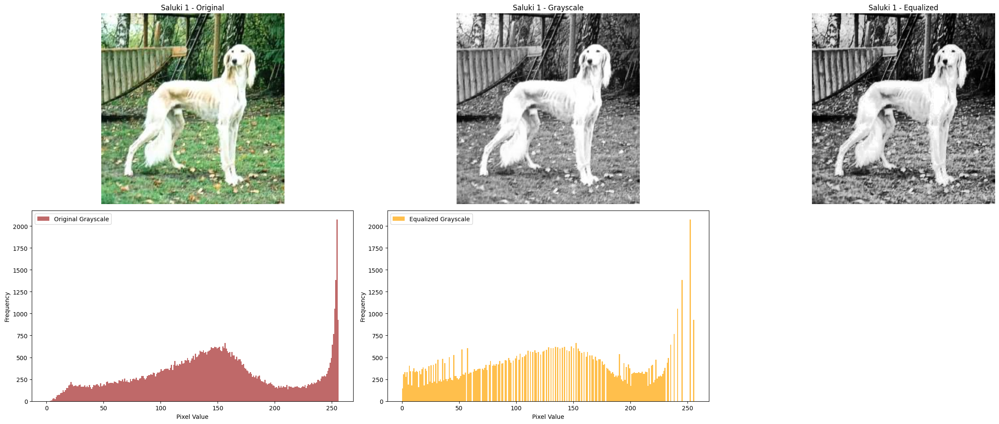

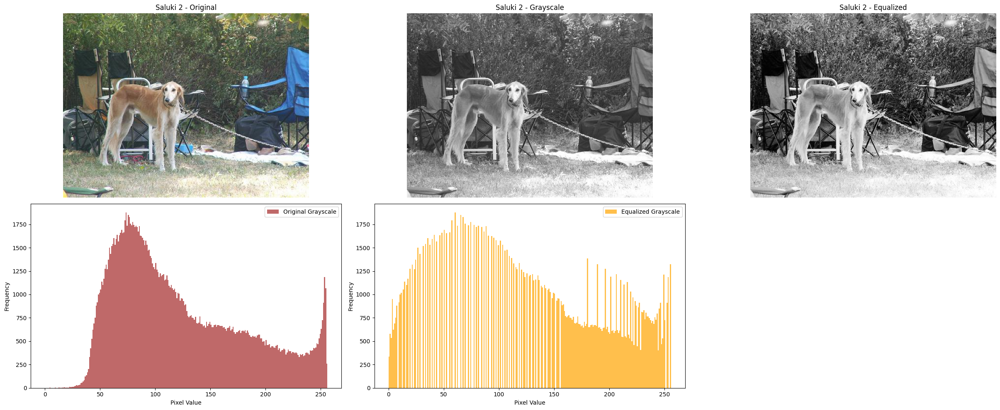

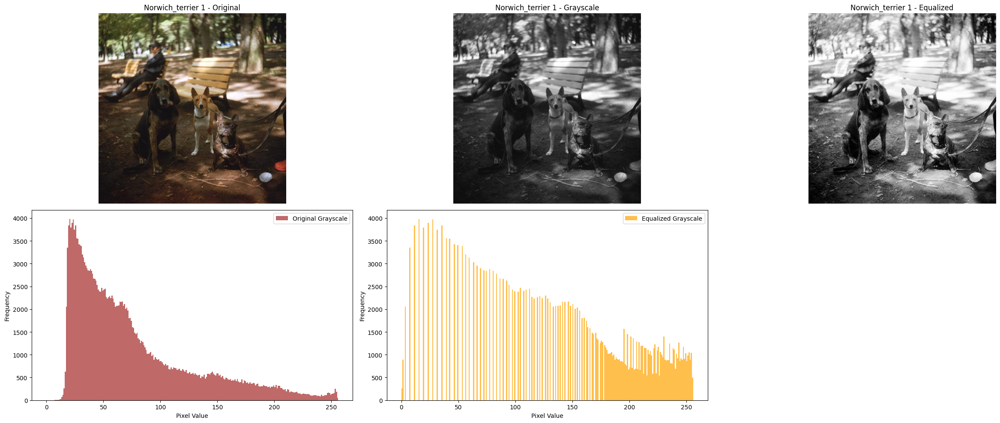

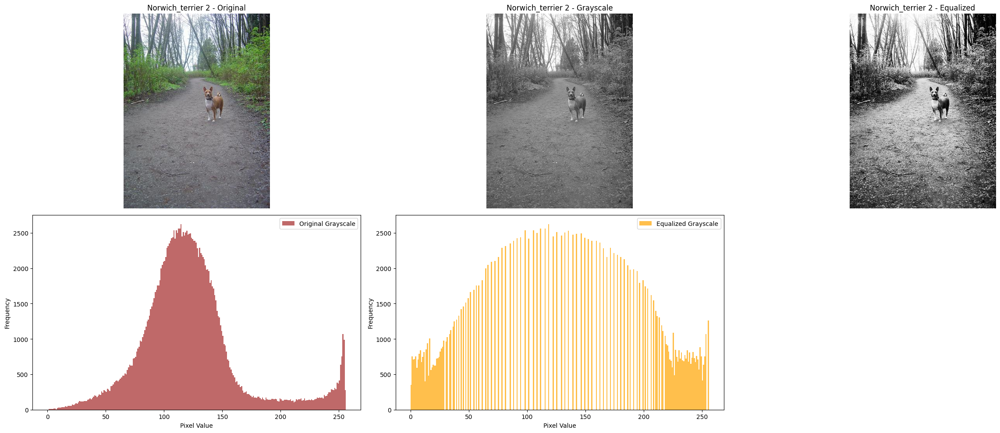

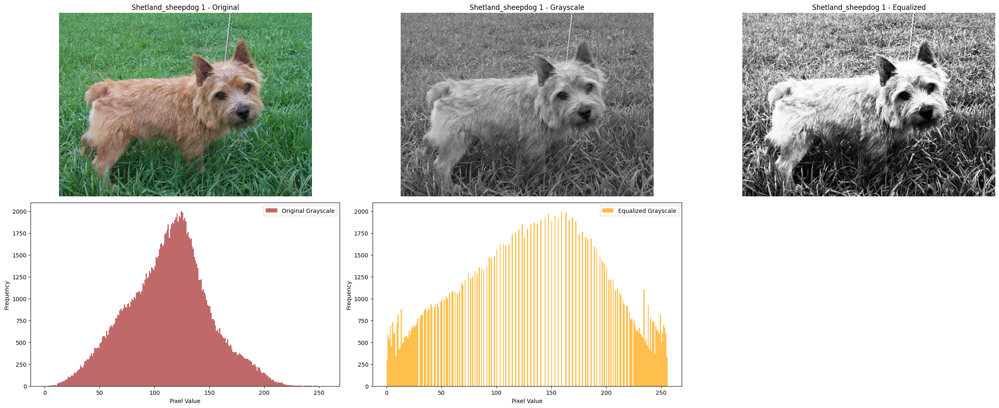

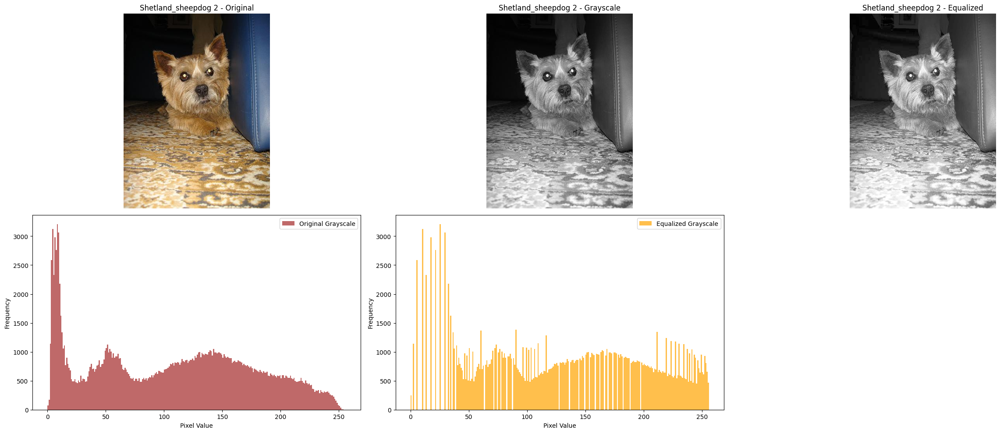

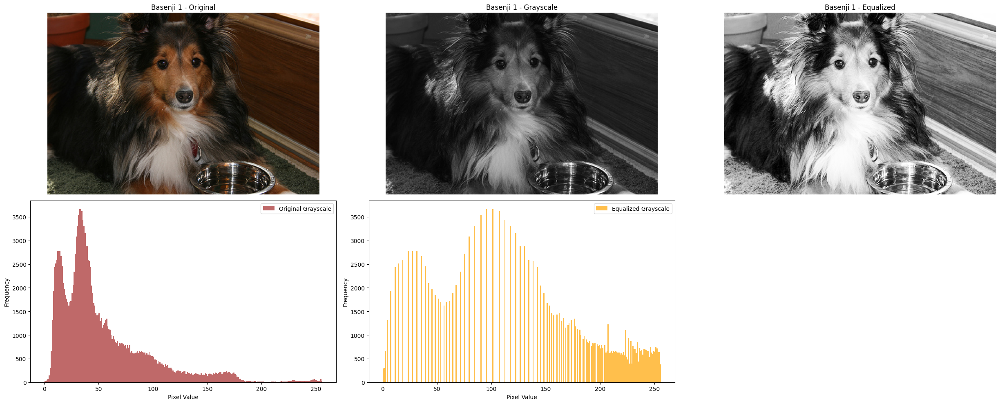

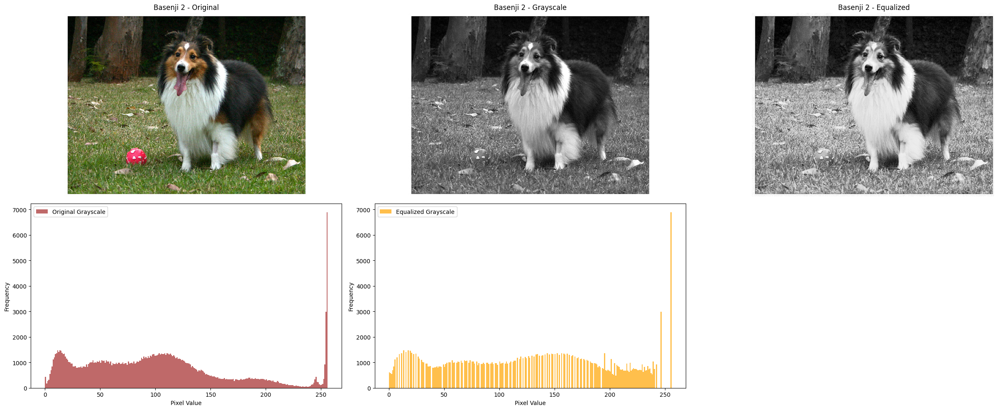

In [ ]:
import cv2
import matplotlib.pyplot as plt


class ImageHandler:
    def __init__(self, folders):
        self.folders = folders

    #Choosing 2 image from each class
    @staticmethod
    def fetch_images_from_directory(directory, count=2):
        """Retrieve a specified number of images from a given directory."""
        image_files = [file for file in os.listdir(directory) if file.endswith('.jpg')]
        return [cv2.imread(os.path.join(directory, img)) for img in image_files[:count]]



    #Convert the color images to grayscale images (MUST use iteration; No points given if no iteration is used) (0.5 point)
    @staticmethod
    def grayscale_conversion(images):
        """Convert the provided images to grayscale."""
        return [cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in images]



    #Plot the 8 grayscale images with their corresponding pixel intensity histograms. (0.5 point)
    @staticmethod
    def equalize_image_histograms(grayscale_images):
        """Perform histogram equalization on provided grayscale images."""
        return [cv2.equalizeHist(img) for img in grayscale_images]



    #erform histogram equalization on the 8 images. Plot the NEW intensity equalized grayscale images and their corresponding equalized pixel intensity histograms. (1.5 point)
    def display_image_comparisons(self, original_images, grayscale_images, equalized_images, image_titles):
        """Display comparison plots for the original, grayscale, and histogram-equalized images."""
        for idx, title in enumerate(image_titles):
            self._comparison_plot(original_images[idx], grayscale_images[idx], equalized_images[idx], title)


    #Pick a grayscale image and its corresponding equalized image. Plot the 2 images next to each other. What did you observe? (0.5 point)
    @staticmethod
    def _comparison_plot(img, gray, equalized, title_prefix):
        """Internal method to plot and compare original, grayscale, and histogram-equalized images."""
        plt.figure(figsize=(25, 10))

        # Display the original image
        plt.subplot(2, 3, 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"{title_prefix} - Original")
        plt.axis('off')

        # Display the grayscale image
        plt.subplot(2, 3, 2)
        plt.imshow(gray, cmap='gray')
        plt.title(f"{title_prefix} - Grayscale")
        plt.axis('off')

        # Display the histogram-equalized image
        plt.subplot(2, 3, 3)
        plt.imshow(equalized, cmap='gray')
        plt.title(f"{title_prefix} - Equalized")
        plt.axis('off')

        # Histogram of original grayscale
        plt.subplot(2, 3, 4)
        plt.hist(gray.ravel(), 256, [0, 256], color='brown', alpha=0.7, label='Original Grayscale')
        plt.xlabel('Pixel Value')
        plt.ylabel('Frequency')
        plt.legend()

        # Histogram of equalized grayscale
        plt.subplot(2, 3, 5)
        plt.hist(equalized.ravel(), 256, [0, 256], color='orange', alpha=0.7, label='Equalized Grayscale')
        plt.xlabel('Pixel Value')
        plt.ylabel('Frequency')
        plt.legend()

        plt.tight_layout()
        plt.show()


directories = [
    "Images/n02091831-Saluki", "Images/n02110806-basenji", "Images/n02094258-Norwich_terrier",
    "Images/n02105855-Shetland_sheepdog"

]

handler = ImageHandler(directories)

all_images = [img for directory in directories for img in handler.fetch_images_from_directory(directory)]
grayscale_images = handler.grayscale_conversion(all_images)
equalized_images = handler.equalize_image_histograms(grayscale_images)

titles = [
    "Saluki 1", "Saluki 2", "Norwich_terrier 1", "Norwich_terrier 2", "Shetland_sheepdog 1", "Shetland_sheepdog 2",
    "Basenji 1", "Basenji 2"
]

handler.display_image_comparisons(all_images, grayscale_images, equalized_images, titles)

 Equalized image has a more balanced and enhanced contrast compared to the original grayscale image. Histogram equalization redistributes the pixel intensities to cover the full dynamic range, which often results in improved visibility of details in the image.


## 2c

RGB histogram

i. Choose 1 image from each class.

ii. Plot the images with their corresponding RGB histogram values (The three curves MUST be
in one figure - see Figure 1, add x-axis label “Intensity” and y-axis label “Pixel Count” ). (1
point)


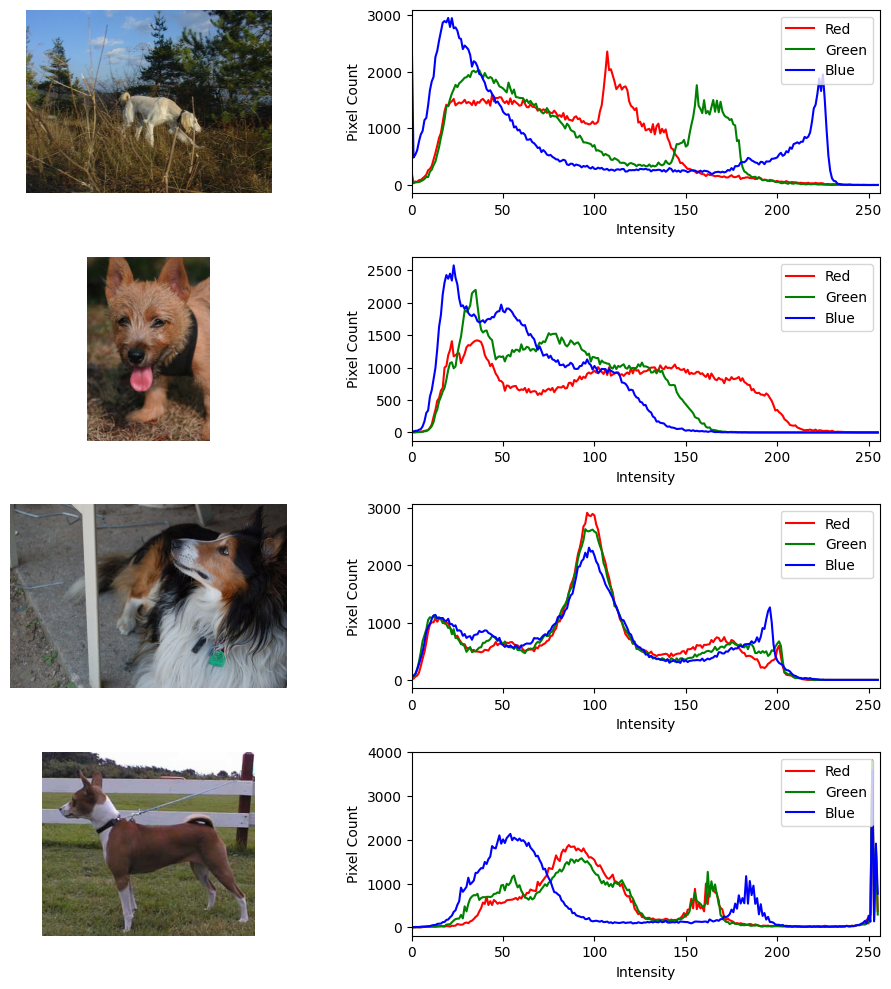

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt



class ImageVisualizer:
    def __init__(self, base_directory):
        self.base_directory = base_directory


    #Choose 1 image from each class
    def _get_image_paths(self):
        """Construct image paths for specific images from different classes."""
        images_subdir = os.path.join(self.base_directory, 'Images')
        specific_images = [
            ('n02091831-Saluki', 'n02091831_151.jpg'),
            ('n02094258-Norwich_terrier', 'n02094258_72.jpg'),
            ('n02105855-Shetland_sheepdog', 'n02105855_1013.jpg'),
            ('n02110806-basenji', 'n02110806_111.jpg')
        ]
        return [os.path.join(images_subdir, category, img_name) for category, img_name in specific_images]


    #Plot the images with their corresponding RGB histogram values (The three curves MUST be in one figure - see Figure 1, add x-axis label “Intensity” and y-axis label “Pixel Count” ). (1 point)
    def _extract_rgb_histograms(self, image):
        """Extract RGB histograms from a given image."""
        histogram = image.histogram()
        return histogram[0:256], histogram[256:512], histogram[512:768]

    def display_image_histograms(self):
        """Display images alongside their RGB histograms."""
        image_paths = self._get_image_paths()
        fig, axes = plt.subplots(len(image_paths), 2, figsize=(10, 10))

        for idx, img_path in enumerate(image_paths):
            image = Image.open(img_path)

            # Display the image
            axes[idx, 0].imshow(image)
            axes[idx, 0].axis('off')

            # Extract and plot RGB histograms
            red_hist, green_hist, blue_hist = self._extract_rgb_histograms(image)
            axes[idx, 1].plot(red_hist, color='red', label='Red')
            axes[idx, 1].plot(green_hist, color='green', label='Green')
            axes[idx, 1].plot(blue_hist, color='blue', label='Blue')
            axes[idx, 1].set_xlim([0, 256])
            axes[idx, 1].legend(loc="upper right")
            axes[idx, 1].set_xlabel('Intensity')
            axes[idx, 1].set_ylabel('Pixel Count')

        plt.tight_layout()
        plt.show()


visualizer = ImageVisualizer(os.getcwd())
visualizer.display_image_histograms()


## 2d

Histogram Comparison (Measures of Similarity and Dissimilarity) (see https://docs.
opencv.org/3.4/d8/dc8/tutorial_histogram_comparison.html)

i. Pick 2 images from the same class and 1 image from another class.

ii. Convert the three images to grayscale pixel intensity histograms. (These will be the vector
representations of the images)

iii. Perform histogram comparison using the following metrics/measures.

• Euclidean Distance

• Manhattan Distance

• Bhattacharyya distance

• Histogram Intersection

For this task, you will compare histograms by computing the metrics/measures of (1) the 2
images from the same class, AND (2) 2 images from different classes. (2 points) (Note: You
can also use other packages.)


In [ ]:

import numpy as np
import cv2


class HistogramAnalyzer:
    def __init__(self, image_path):
        self.image_path = image_path
        self.histogram = self._compute_histogram()


    #Convert the three images to grayscale pixel intensity histograms. (These will be the vector representations of the images)
    def _compute_histogram(self):
        """Calculate normalized histogram for the image."""
        img = cv2.imread(self.image_path, 0)  # Grayscale loading
        hist = cv2.calcHist([img], [0], None, [256], [0, 256])
        return hist.ravel() / hist.sum()


    #Perform histogram comparison using the following metrics/measures.


    #Euclidean Distance
    def euclidean_dist(self, other_hist):
        return np.linalg.norm(self.histogram - other_hist)

    #Manhattan Distance

    def manhattan_dist(self, other_hist):
        return np.sum(np.abs(self.histogram - other_hist))

    #Bhattacharyya distance
    def bhattacharyya_dist(self, other_hist):
        return -np.log(np.sum(np.sqrt(self.histogram * other_hist)))
    # Histogram Intersection
    def histogram_intersection_value(self, other_hist):
        return np.sum(np.minimum(self.histogram, other_hist))

#For this task, you will compare histograms by computing the metrics/measures of (1) the 2 images from the same class, AND (2) 2 images from different classes. (2 points) (Note: You can also use other packages.)
def display_comparison(image1, image2, title):
    print(title)
    print("Euclidean Distance:", image1.euclidean_dist(image2.histogram))
    print("Manhattan Distance:", image1.manhattan_dist(image2.histogram))
    print("Bhattacharyya Distance:", image1.bhattacharyya_dist(image2.histogram))
    print("Histogram Intersection:", image1.histogram_intersection_value(image2.histogram))
    print()


Saluki1 = HistogramAnalyzer("Images/n02091831-Saluki/n02091831_151.jpg")
Saluki2 = HistogramAnalyzer("Images/n02091831-Saluki/n02091831_256.jpg")
Basenji = HistogramAnalyzer("Images/n02110806-basenji/n02110806_346.jpg")

display_comparison(Saluki1, Saluki2, "Comparison for images from the same class:")
display_comparison(Saluki1, Basenji, "Comparison for images from different classes:")

Comparison for images from the same class:
Euclidean Distance: 0.05727541
Manhattan Distance: 0.7222369
Bhattacharyya Distance: 0.11116709
Histogram Intersection: 0.63888156

Comparison for images from different classes:
Euclidean Distance: 0.045395907
Manhattan Distance: 0.59964323
Bhattacharyya Distance: 0.086006336
Histogram Intersection: 0.7001784




## 2e
Image Feature Descriptor: ORB (Oriented FAST and Rotated BRIEF) (see https://docs.
opencv.org/3.4/d1/d89/tutorial_py_orb.html)

i. Pick 1 image and perform keypoint extraction using ORB feature descriptor.

(Hint:
orb = cv.ORB_create(edgeThreshold=edge_threshold,
patchSize=30, nlevels=8, fastThreshold=20,
scaleFactor=1.2, WTA_K=2,scoreType=cv.ORB_HARRIS_SCORE,
firstLevel=0, nfeatures=30)
### find the keypoints with ORB
kp = orb.detect(img,None)
### draw only keypoints location,not size and orientation
img2 = cv.drawKeypoints(img, kp, None, color=(0,255,0))
)

ii. Try to extract between 25 and 75 keypoints. What is the number of keypoints extracted? What
are the edge threshold value and patchSize you used? (Edge threshold is the size of the border
where the features are not detected. It should roughly match the patchSize parameter). (0.5
points)

iii. Plot the keypoints on the image. (see Fig 2 for one such figure) (0.5 point)

In [ ]:



class ORBKeypointExtractor:
    def __init__(self, image_path):
        self.image = cv2.imread(image_path)
        self.gray_image = cv2.cvtColor(self.image, cv2.COLOR_BGR2GRAY)
        self.edge_threshold = 15
        self.patch_size = 15

    def _tune_parameters(self):
        """Iteratively adjust parameters to get a desired number of keypoints."""
        max_iterations = 50
        iteration = 0

        while iteration < max_iterations:
            orb = cv2.ORB_create(edgeThreshold=self.edge_threshold,
                                 patchSize=self.patch_size,
                                 nlevels=8,
                                 fastThreshold=20,
                                 scaleFactor=1.2,
                                 WTA_K=2,
                                 scoreType=cv2.ORB_HARRIS_SCORE,
                                 firstLevel=0,
                                 nfeatures=30)

            keypoints = orb.detect(self.gray_image, None)

            if 25 <= len(keypoints) <= 75:
                return keypoints

            if len(keypoints) < 25:
                self.edge_threshold -= 1
            else:
                self.edge_threshold += 1

            self.patch_size = self.edge_threshold
            iteration += 1
        return keypoints

    def display_keypoints(self):
        """Display the image with keypoints marked."""
        keypoints = self._tune_parameters()
        output_image = cv2.drawKeypoints(self.gray_image, keypoints, self.image, color=(0, 255, 0))

        plt.imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB))
        plt.title(f"Keypoints Detected: {len(keypoints)}")
        plt.show()

        print(f"The number of keypoints extracted for this figure are: {len(keypoints)}")
        print(f"The Edge Threshold used is: {self.edge_threshold}")
        print(f"The PatchSize used is: {self.patch_size}")





Saluki


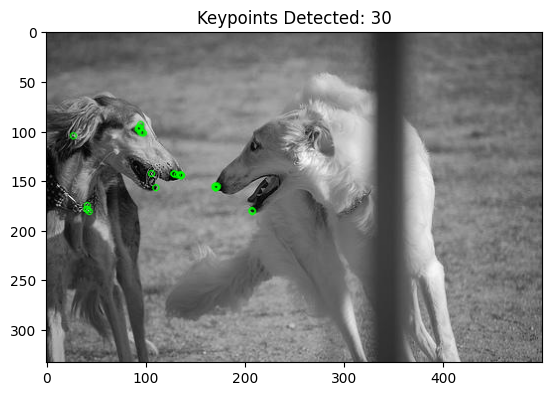

The number of keypoints extracted for this figure are: 30
The Edge Threshold used is: 15
The PatchSize used is: 15


In [ ]:
print("\nSaluki")
chihuahua_image1 = ORBKeypointExtractor(
    "/content/Images/n02091831-Saluki/n02091831_10215.jpg")  # Replace with image path
chihuahua_image1.display_keypoints()



Norwich_terrier


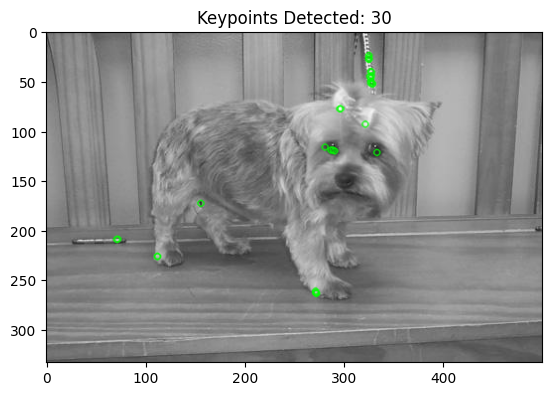

The number of keypoints extracted for this figure are: 30
The Edge Threshold used is: 15
The PatchSize used is: 15


In [ ]:


print("\nNorwich_terrier")
chihuahua_image2 = ORBKeypointExtractor(
    "/content/Images/n02094258-Norwich_terrier/n02094258_1003.jpg")  # Replace with image path
chihuahua_image2.display_keypoints()



Shetland_sheepdog


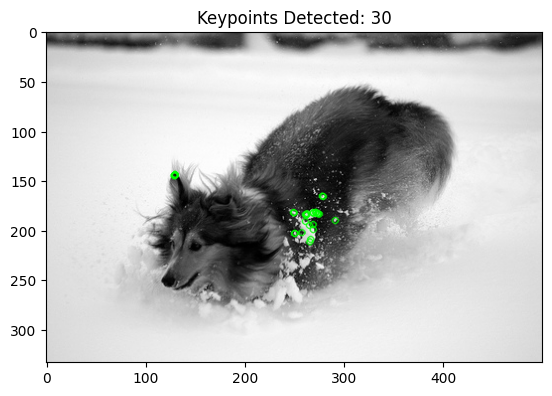

The number of keypoints extracted for this figure are: 30
The Edge Threshold used is: 15
The PatchSize used is: 15


In [ ]:
print("\nShetland_sheepdog")
chihuahua_image3 = ORBKeypointExtractor(
    "/content/Images/n02105855-Shetland_sheepdog/n02105855_10095.jpg")  # Replace with image path
chihuahua_image3.display_keypoints()


basenji


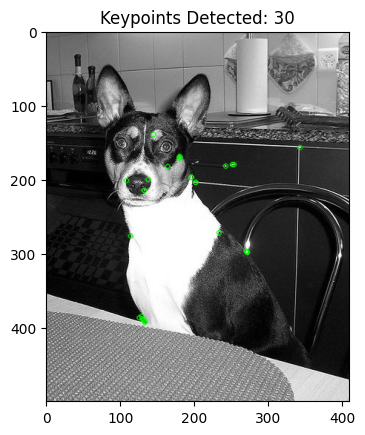

The number of keypoints extracted for this figure are: 30
The Edge Threshold used is: 15
The PatchSize used is: 15


In [ ]:
print("\nbasenji")
chihuahua_image4 = ORBKeypointExtractor(
    "/content/Images/n02110806-basenji/n02110806_1013.jpg")  # Replace with image path
chihuahua_image4.display_keypoints()

## 2f

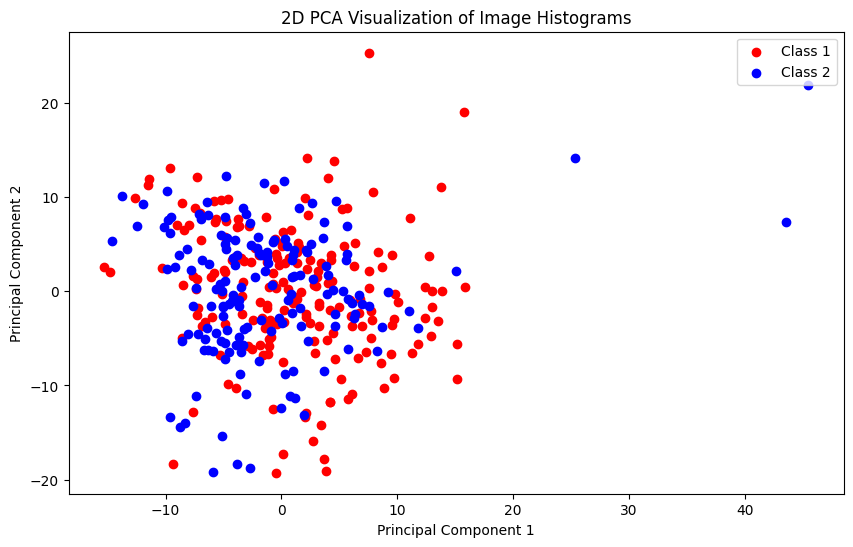

In [ ]:
import cv2
import os
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


class ImageHistogramPCA:
    def __init__(self, folder_path_1, folder_path_2):
        self.folder_path_1 = folder_path_1
        self.folder_path_2 = folder_path_2

    @staticmethod
    def _compute_histogram(image_path):
        """Compute grayscale histogram for the given image."""
        image = cv2.imread(image_path)
        grayscale = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        histogram = cv2.calcHist([grayscale], [0], None, [256], [0, 256])
        return histogram.ravel()

    def _load_histograms(self):
        """Load histograms for all images in the provided folders."""
        histograms_data = []
        for folder in [self.folder_path_1, self.folder_path_2]:
            for filename in os.listdir(folder):
                hist = self._compute_histogram(os.path.join(folder, filename))
                histograms_data.append(hist)
        return histograms_data

    def visualize_pca(self):
        """Visualize the PCA results in 2D."""
        histograms = self._load_histograms()

        # Normalize the data
        histograms = StandardScaler().fit_transform(histograms)

        # Apply PCA for dimensionality reduction to 2D
        pca_processor = PCA(n_components=2)
        transformed_data = pca_processor.fit_transform(histograms)

        plt.figure(figsize=(10, 6))
        plt.scatter(transformed_data[:len(os.listdir(self.folder_path_1)), 0],
                    transformed_data[:len(os.listdir(self.folder_path_1)), 1], c='r', label="Class 1")
        plt.scatter(transformed_data[len(os.listdir(self.folder_path_1)):, 0],
                    transformed_data[len(os.listdir(self.folder_path_1)):, 1], c='b', label="Class 2")
        plt.xlabel('Principal Component 1')
        plt.ylabel('Principal Component 2')
        plt.title('2D PCA Visualization of Image Histograms')
        plt.legend()
        plt.show()


class1_path = "Images/n02091831-Saluki"
class2_path = "Images/n02105855-Shetland_sheepdog"

pca_visualizer = ImageHistogramPCA(class1_path, class2_path)
pca_visualizer.visualize_pca()
